# Dublin Bike Analysis for June 2024

### 1. Introduction:
This notebbok analyses the dataset dublin_bikes (dublin-bikes_station_status_062024.csv),to understand the bike availability and usage of bikes at various stations in Dublin for the month June 2024.

Data preparation and visualization and various machine learning models are used to predict the bikes availibility based on station capacity and number of docks available at various station.

In [1]:
#Import all the required libraries.
import pandas as pd
import warnings

import numpy as np
from matplotlib import pyplot as plt
warnings.filterwarnings('ignore')
import seaborn as sns
from scipy.stats import norm
from scipy import stats
from scipy.stats import skew

import plotly.express as px
import dash
from dash import dcc
from dash import html
from dash.dependencies import Input, Output


from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor

from dash import Dash, dcc, html, Input, Output
from sklearn import linear_model, tree, neighbors, ensemble
import plotly.graph_objects as go
import plotly.express as px
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score , mean_absolute_error, mean_squared_error
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import GridSearchCV

In [2]:
# Code for ignoring warning messages.
def ignore_warning():  
    return warnings.filterwarnings(action='ignore')

# function call
ignore_warning() 

# 2. Loading the Dataset

In [3]:
#%%timeit
#creating a dataframe in current working directory
dublin_bikes = pd.read_csv('dublin-bikes_station_status_062024.csv')

In [4]:
#reading initial 5 observation and the variables in the dataset.
dublin_bikes.head()

,system_id,last_reported,station_id,num_bikes_available,num_docks_available,is_installed,is_renting,is_returning,name,short_name,address,lat,lon,region_id,capacity
0,dublin_bikes,2024-06-01 00:05:00,101,7,23,True,True,True,KING STREET NORTH,NaN,King Street North,53.350292,-6.273507,NaN,30
1,dublin_bikes,2024-06-01 00:05:00,102,16,24,True,True,True,WESTERN WAY,NaN,Western Way,53.354930,-6.269425,NaN,40
2,dublin_bikes,2024-06-01 00:05:00,106,2,38,True,True,True,RATHDOWN ROAD,NaN,Rathdown Road,53.358930,-6.280337,NaN,40
3,dublin_bikes,2024-06-01 00:05:00,107,6,34,True,True,True,CHARLEVILLE ROAD,NaN,Charleville Road,53.359158,-6.281866,NaN,40
4,dublin_bikes,2024-06-01 00:05:00,11,1,29,True,True,True,EARLSFORT TERRACE,NaN,Earlsfort Terrace,53.334293,-6.258503,NaN,30


In [5]:
#reading last 5 observation and the variables in the dataset.
dublin_bikes.tail()

,system_id,last_reported,station_id,num_bikes_available,num_docks_available,is_installed,is_renting,is_returning,name,short_name,address,lat,lon,region_id,capacity
315742,dublin_bikes,2024-06-17 08:45:00,80,14,26,True,True,True,ST JAMES HOSPITAL (LUAS),NaN,St James Hospital (Luas),53.341360,-6.292951,NaN,40
315743,dublin_bikes,2024-06-17 08:45:00,86,1,37,True,True,True,PARKGATE STREET,NaN,Parkgate Street,53.347973,-6.291804,NaN,38
315744,dublin_bikes,2024-06-17 08:45:00,89,11,29,True,True,True,FITZWILLIAM SQUARE EAST,NaN,Fitzwilliam Square East,53.335213,-6.250900,NaN,40
315745,dublin_bikes,2024-06-17 08:45:00,90,30,10,True,True,True,BENSON STREET,NaN,Benson Street,53.344154,-6.233451,NaN,40
315746,dublin_bikes,2024-06-17 08:45:00,92,9,31,True,True,True,HEUSTON BRIDGE (NORTH),NaN,Heuston Bridge (North),53.347800,-6.292432,NaN,40


# 3. Exploratory Data Analysis

In [6]:
#Identifying the number of rows in the dataset
dublin_bikes.shape

(315747, 15)

In [7]:
#Identifying the data types for each variable and non-null values
dublin_bikes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 315747 entries, 0 to 315746
Data columns (total 15 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   system_id            315747 non-null  object 
 1   last_reported        315747 non-null  object 
 2   station_id           315747 non-null  int64  
 3   num_bikes_available  315747 non-null  int64  
 4   num_docks_available  315747 non-null  int64  
 5   is_installed         315747 non-null  bool   
 6   is_renting           315747 non-null  bool   
 7   is_returning         315747 non-null  bool   
 8   name                 315747 non-null  object 
 9   short_name           0 non-null       float64
 10  address              315747 non-null  object 
 11  lat                  315747 non-null  float64
 12  lon                  315747 non-null  float64
 13  region_id            0 non-null       float64
 14  capacity             315747 non-null  int64  
dtypes: bool(3), float

The .info() function indicates that variable 'short_name' and 'region_id' have zero non-null values.So, all the values are missing in these columns. All other columns have same number of values as number of observations found using .shape() function above.The same can be validated using isnull().sum() function below.

In [8]:
#get the count of observations for each variable.
dublin_bikes.count()

system_id              315747
last_reported          315747
station_id             315747
num_bikes_available    315747
num_docks_available    315747
is_installed           315747
is_renting             315747
is_returning           315747
name                   315747
short_name                  0
address                315747
lat                    315747
lon                    315747
region_id                   0
capacity               315747
dtype: int64

In [9]:
#number of missing values per column
dublin_bikes.isnull().sum()

system_id                   0
last_reported               0
station_id                  0
num_bikes_available         0
num_docks_available         0
is_installed                0
is_renting                  0
is_returning                0
name                        0
short_name             315747
address                     0
lat                         0
lon                         0
region_id              315747
capacity                    0
dtype: int64

In [10]:
#Dropped the column "short_name","region_id" as there are zero observations for these variables.
dublin_bikes = dublin_bikes.drop(["short_name","region_id"],axis=1)

In [11]:
#verifying the variable is deleted by displaying the data.
dublin_bikes.head()

,system_id,last_reported,station_id,num_bikes_available,num_docks_available,is_installed,is_renting,is_returning,name,address,lat,lon,capacity
0,dublin_bikes,2024-06-01 00:05:00,101,7,23,True,True,True,KING STREET NORTH,King Street North,53.350292,-6.273507,30
1,dublin_bikes,2024-06-01 00:05:00,102,16,24,True,True,True,WESTERN WAY,Western Way,53.354930,-6.269425,40
2,dublin_bikes,2024-06-01 00:05:00,106,2,38,True,True,True,RATHDOWN ROAD,Rathdown Road,53.358930,-6.280337,40
3,dublin_bikes,2024-06-01 00:05:00,107,6,34,True,True,True,CHARLEVILLE ROAD,Charleville Road,53.359158,-6.281866,40
4,dublin_bikes,2024-06-01 00:05:00,11,1,29,True,True,True,EARLSFORT TERRACE,Earlsfort Terrace,53.334293,-6.258503,30


In [12]:
#checking the number of columns are 15-2 =13 after dropping two columns. 
dublin_bikes.shape

(315747, 13)

In [13]:
dublin_bikes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 315747 entries, 0 to 315746
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   system_id            315747 non-null  object 
 1   last_reported        315747 non-null  object 
 2   station_id           315747 non-null  int64  
 3   num_bikes_available  315747 non-null  int64  
 4   num_docks_available  315747 non-null  int64  
 5   is_installed         315747 non-null  bool   
 6   is_renting           315747 non-null  bool   
 7   is_returning         315747 non-null  bool   
 8   name                 315747 non-null  object 
 9   address              315747 non-null  object 
 10  lat                  315747 non-null  float64
 11  lon                  315747 non-null  float64
 12  capacity             315747 non-null  int64  
dtypes: bool(3), float64(2), int64(4), object(4)
memory usage: 25.0+ MB


The info function shows every variable has same number of non-null values.

##### 3.1 Identifying the number of unique values for categorical variables in the dataset.

In [14]:
# List of categorical columns
categorical_columns = ['system_id', 'name', 'address']

# Dictionary to store unique values
unique_values = {}

# Dictionary to store unique values and their counts
unique_values_count = {}

# Get unique values and their counts for each categorical column
for column in categorical_columns:
    unique_values_count[column] = {
        'unique_values': dublin_bikes[column].unique(),
        'count': dublin_bikes[column].nunique()}


# Print unique values and their counts for each categorical column
for column, values in unique_values_count.items():
    print(f"Unique values for {column}: {values['unique_values']}\n")
    print(f"Count of unique values for {column}: {values['count']}\n")

Unique values for system_id: ['dublin_bikes']

Count of unique values for system_id: 1

Unique values for name: ['KING STREET NORTH' 'WESTERN WAY' 'RATHDOWN ROAD' 'CHARLEVILLE ROAD'
 'EARLSFORT TERRACE' 'MOUNTJOY SQUARE EAST' 'MERRION SQUARE SOUTH'
 'BROADSTONE' 'HANOVER QUAY EAST' 'ECCLES STREET'
 'FITZWILLIAM SQUARE WEST' 'FOWNES STREET UPPER' 'GEORGES QUAY'
 'BLESSINGTON STREET' 'LEINSTER STREET SOUTH' 'CUSTOM HOUSE'
 'PARNELL SQUARE NORTH' 'PARNELL STREET' "ST. STEPHEN'S GREEN EAST"
 "ST. STEPHEN'S GREEN SOUTH" 'WILTON TERRACE' 'HARCOURT TERRACE'
 'PORTOBELLO ROAD' 'GUILD STREET' 'CHARLEMONT PLACE' 'GEORGES LANE'
 'YORK STREET EAST' 'CLONMEL STREET' 'CHRISTCHURCH PLACE'
 'NORTH CIRCULAR ROAD' 'HARDWICKE PLACE' 'NEW CENTRAL BANK'
 'GRAND CANAL DOCK' 'OLIVER BOND STREET' 'JAMES STREET'
 'MARKET STREET SOUTH' 'ST JAMES HOSPITAL (LUAS)' 'MOUNT BROWN'
 'COLLINS BARRACKS MUSEUM' 'BLACKHALL PLACE' 'HEUSTON BRIDGE (NORTH)'
 'HEUSTON STATION (CAR PARK)' 'KILMAINHAM LANE' 'CLARENDON ROW'
 'D

The unique function indicates that there are 114 unique streets and address in the dataset.

In [15]:
#checking for any duplicate rows
duplicate_rows_df = dublin_bikes[dublin_bikes.duplicated()]
print("number of duplicate rows: ", duplicate_rows_df.shape)
duplicate_rows_df

number of duplicate rows:  (0, 13)


,system_id,last_reported,station_id,num_bikes_available,num_docks_available,is_installed,is_renting,is_returning,name,address,lat,lon,capacity


In [16]:
#delete the dataframe 'duplicate_rows_df' as it is not required.
del duplicate_rows_df

In [17]:
#get the count of observations/rows for each variable.
dublin_bikes.count()

system_id              315747
last_reported          315747
station_id             315747
num_bikes_available    315747
num_docks_available    315747
is_installed           315747
is_renting             315747
is_returning           315747
name                   315747
address                315747
lat                    315747
lon                    315747
capacity               315747
dtype: int64

In [18]:
# Convert timestamp to datetime
dublin_bikes['last_reported'] = pd.to_datetime(dublin_bikes['last_reported'])

In [19]:
dublin_bikes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 315747 entries, 0 to 315746
Data columns (total 13 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   system_id            315747 non-null  object        
 1   last_reported        315747 non-null  datetime64[ns]
 2   station_id           315747 non-null  int64         
 3   num_bikes_available  315747 non-null  int64         
 4   num_docks_available  315747 non-null  int64         
 5   is_installed         315747 non-null  bool          
 6   is_renting           315747 non-null  bool          
 7   is_returning         315747 non-null  bool          
 8   name                 315747 non-null  object        
 9   address              315747 non-null  object        
 10  lat                  315747 non-null  float64       
 11  lon                  315747 non-null  float64       
 12  capacity             315747 non-null  int64         
dtypes: bool(3), da

In [20]:
#Renamed the columns for better understanding.
dublin_bikes = dublin_bikes.rename(columns={"last_reported": "time_stamp", "address": "location"})
dublin_bikes.head()

,system_id,time_stamp,station_id,num_bikes_available,num_docks_available,is_installed,is_renting,is_returning,name,location,lat,lon,capacity
0,dublin_bikes,2024-06-01 00:05:00,101,7,23,True,True,True,KING STREET NORTH,King Street North,53.350292,-6.273507,30
1,dublin_bikes,2024-06-01 00:05:00,102,16,24,True,True,True,WESTERN WAY,Western Way,53.354930,-6.269425,40
2,dublin_bikes,2024-06-01 00:05:00,106,2,38,True,True,True,RATHDOWN ROAD,Rathdown Road,53.358930,-6.280337,40
3,dublin_bikes,2024-06-01 00:05:00,107,6,34,True,True,True,CHARLEVILLE ROAD,Charleville Road,53.359158,-6.281866,40
4,dublin_bikes,2024-06-01 00:05:00,11,1,29,True,True,True,EARLSFORT TERRACE,Earlsfort Terrace,53.334293,-6.258503,30


In [21]:
#Dropped the column "name" as the data is identical in name and location column,
#the only difference is upper case and lower case
dublin_bikes = dublin_bikes.drop(["name"],axis=1)

In [22]:
#validating after the 'name' column is dropped
dublin_bikes.head()

,system_id,time_stamp,station_id,num_bikes_available,num_docks_available,is_installed,is_renting,is_returning,location,lat,lon,capacity
0,dublin_bikes,2024-06-01 00:05:00,101,7,23,True,True,True,King Street North,53.350292,-6.273507,30
1,dublin_bikes,2024-06-01 00:05:00,102,16,24,True,True,True,Western Way,53.354930,-6.269425,40
2,dublin_bikes,2024-06-01 00:05:00,106,2,38,True,True,True,Rathdown Road,53.358930,-6.280337,40
3,dublin_bikes,2024-06-01 00:05:00,107,6,34,True,True,True,Charleville Road,53.359158,-6.281866,40
4,dublin_bikes,2024-06-01 00:05:00,11,1,29,True,True,True,Earlsfort Terrace,53.334293,-6.258503,30


##### 3.2 Descriptive Statistics

In [23]:
# Descriptive statistics to find outliers
print("Descriptive statistics:")
print(dublin_bikes.describe())


Descriptive statistics:
          station_id  num_bikes_available  num_docks_available            lat  \
count  315747.000000        315747.000000        315747.000000  315747.000000   
mean       57.863372            11.892344            19.885443      53.345462   
std        33.889429            10.506242            11.692189       0.007508   
min         1.000000             0.000000             0.000000      53.330090   
25%        28.000000             3.000000            11.000000      53.339764   
50%        57.000000             9.000000            20.000000      53.344604   
75%        88.000000            19.000000            29.000000      53.350292   
max       117.000000            40.000000            40.000000      53.359966   

                 lon       capacity  
count  315747.000000  315747.000000  
mean       -6.263793      31.974201  
std         0.017870       7.446780  
min        -6.310015      16.000000  
25%        -6.275071      29.000000  
50%        -6.2625

#### 3.3 Verifying if there is any invalid values in latitude and longitude observations.

In [24]:
# Valid latitude range is -90 to 90 and longitude is -180 to 180
valid_lat = dublin_bikes['lat'].between(-90, 90)
valid_lon = dublin_bikes['lon'].between(-180, 180)

# Find and print invalid latitude and longitude values
invalid_lat = dublin_bikes[~valid_lat]
invalid_lon = dublin_bikes[~valid_lon]

print("\n Invalid latitude values:")
print(invalid_lat[['location', 'lat']])

print("\n Invalid longitude values:")
print(invalid_lon[['location', 'lon']])

# Filter out invalid coordinates
dublin_bikes = dublin_bikes[valid_lat & valid_lon]



 Invalid latitude values:
Empty DataFrame
Columns: [location, lat]
Index: []

 Invalid longitude values:
Empty DataFrame
Columns: [location, lon]
Index: []


There are no invalid values identified for 'lat' and 'lon' in this step

In [25]:
dublin_bikes.shape

(315747, 12)

#### 3.4 Extracting hour, utilization and day of the week for further analysis

In [26]:
# Extract hour from timestamp
dublin_bikes['hour'] = dublin_bikes['time_stamp'].dt.hour

# Calculate the station utilization
dublin_bikes['utilization'] = (dublin_bikes['num_bikes_available'] / dublin_bikes['capacity']) * 100

# Extract the day of the week from the timestamp (0 = Monday, 6 = Sunday)
dublin_bikes['day_of_week'] = dublin_bikes['time_stamp'].dt.dayofweek

In [27]:
%%timeit
dublin_bikes.head()

9.28 µs ± 732 ns per loop (mean ± std. dev. of 7 runs, 100,000 loops each)


#### 3.5 Box plot to visualize data distribution and skewness of data

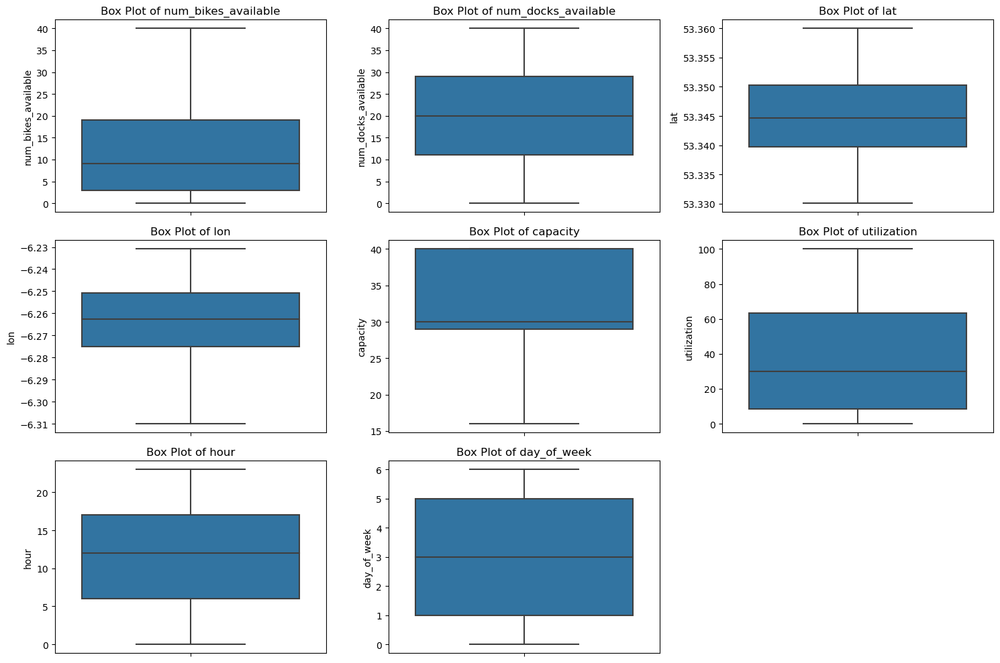

In [28]:
# Select numeric columns
numeric_columns = ['num_bikes_available', 'num_docks_available', 'lat', 'lon', 'capacity', 'utilization', 'hour', 'day_of_week']

# Create a box plot for each numeric column
plt.figure(figsize=(15, 10))

for i, column in enumerate(numeric_columns, 1):
    plt.subplot(3, 3, i)
    sns.boxplot(y=dublin_bikes[column])
    plt.title(f'Box Plot of {column}')

plt.tight_layout()
plt.show()

#### Calculating Skewness of the data.

In [29]:
#Select numeric columns
numeric_columns = dublin_bikes.select_dtypes(include=['number'])

# Calculate skewness for each numeric column
skewness = numeric_columns.skew()

# Display the skewness values
print(skewness)

station_id             0.054176
num_bikes_available    0.756030
num_docks_available   -0.042333
lat                    0.095911
lon                   -0.471966
capacity              -0.397324
hour                  -0.082112
utilization            0.512813
day_of_week           -0.184341
dtype: float64


##### 3.6 data distribution for the different variables in the dataset.

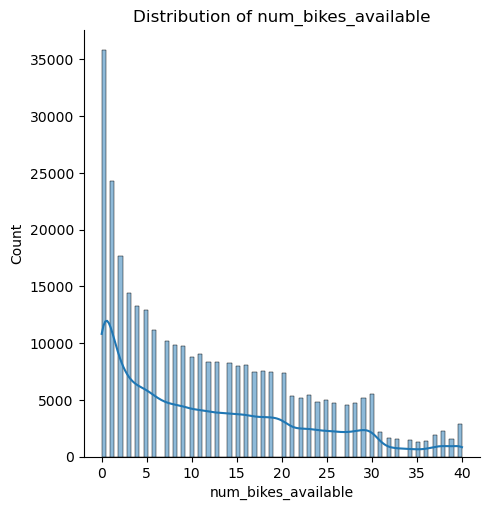

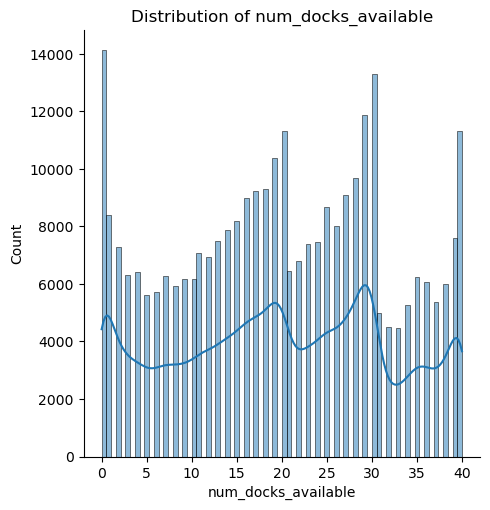

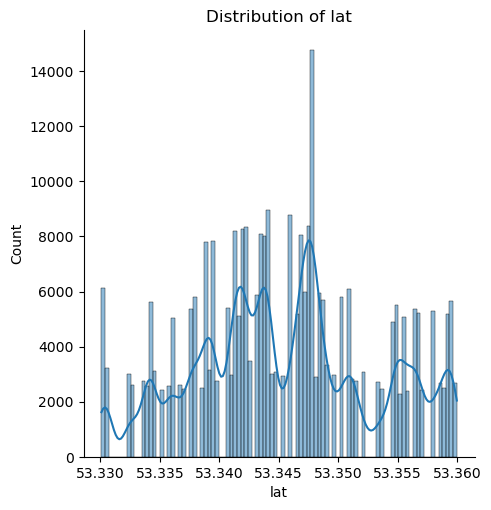

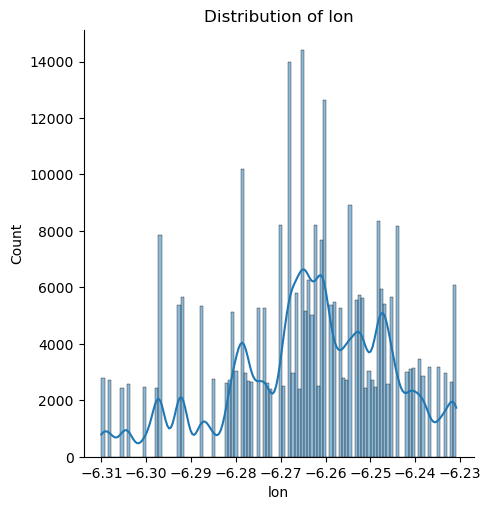

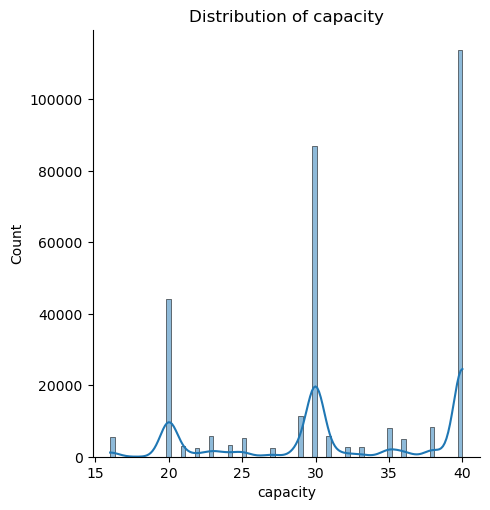

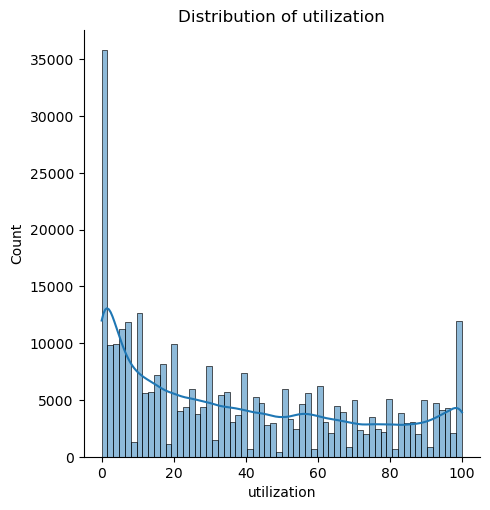

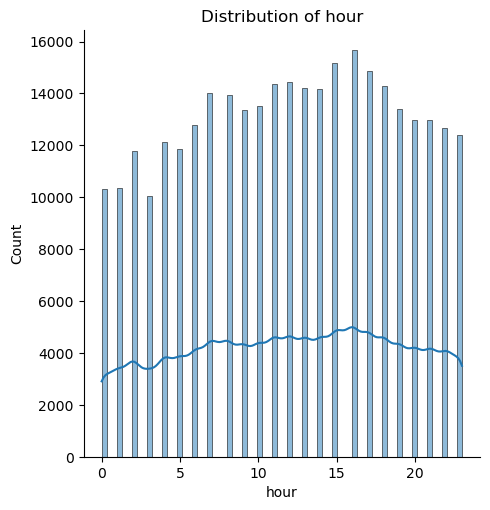

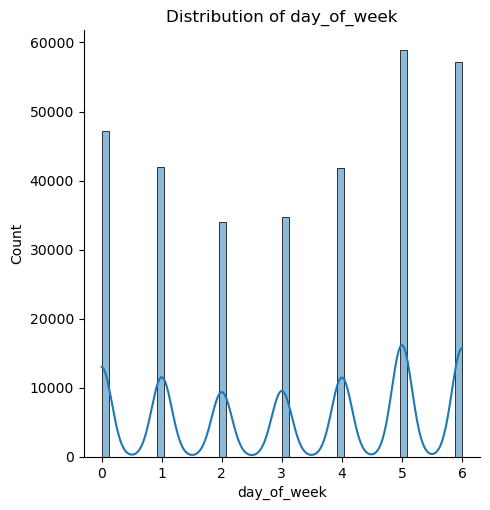

In [30]:
# Select numeric columns
numeric_columns = ['num_bikes_available', 'num_docks_available', 'lat', 'lon', 'capacity', 'utilization', 'hour', 'day_of_week']

# Create a displot for each numeric column
for column in numeric_columns:
    sns.displot(dublin_bikes[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.show()

## 4. Data Visualization

#### 4.1 Visualize average number of bikes available for each station

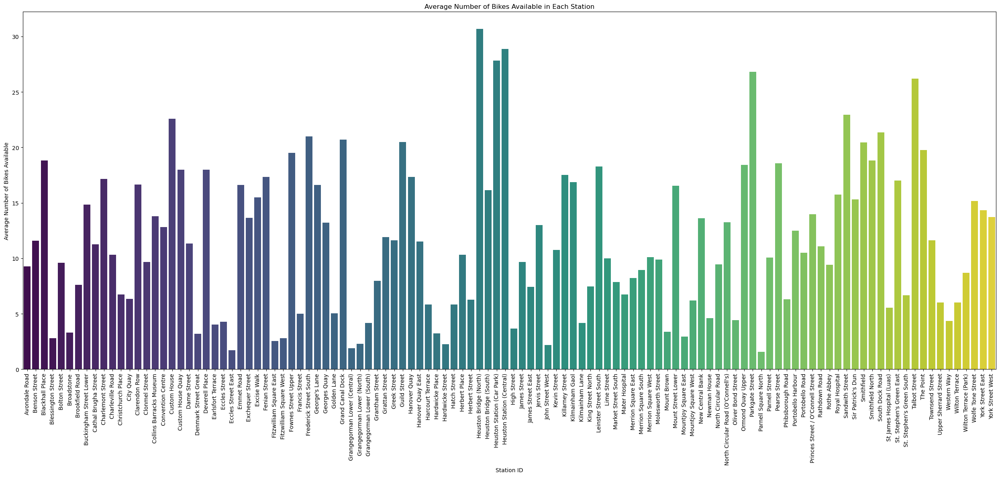

In [31]:
# Calculate average number of bikes available for each station
average_bikes_per_station = dublin_bikes.groupby('location')['num_bikes_available'].mean().reset_index()

# Plotting
plt.figure(figsize=(25, 12))

# Bar plot
sns.barplot(x='location', y='num_bikes_available', data=average_bikes_per_station, palette='viridis')
plt.title('Average Number of Bikes Available in Each Station')
plt.xlabel('Station ID')
plt.ylabel('Average Number of Bikes Available')
# Rotate x-axis labels for better readability
plt.xticks(rotation=90)  

plt.tight_layout()
plt.show()

We can observe that Heuston Bridge(North) has the maximum number of bikes available folowed by Talbot Street and least numbe of bikes available at Parnell Square North

##### 4.2 Visualize average number of bikes available for each day of the week

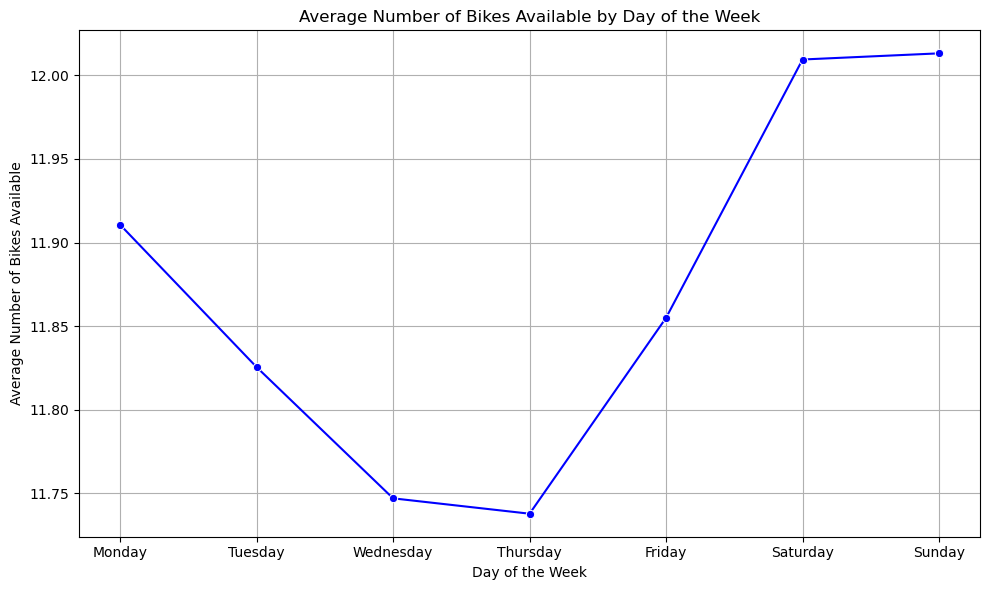

In [32]:
# Calculate average number of bikes available for each day of the week
average_bikes_per_day = dublin_bikes.groupby('day_of_week')['num_bikes_available'].mean().reset_index()

# Plotting
plt.figure(figsize=(10, 6))

# Line plot
sns.lineplot(x='day_of_week', y='num_bikes_available', data=average_bikes_per_day, marker='o', color='b')
plt.title('Average Number of Bikes Available by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Number of Bikes Available')
plt.xticks(ticks=range(7), labels=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

# Added grid for better readability
plt.grid(True)  
plt.tight_layout()
plt.show()

It is observed that average number of bikes available across Dublin city is more(12 to 13) on saturday and sunday. We see a gradual decrease in the number of bikes available at the station from Monday to Thursday which indicates, bikes usage is higher on these days and there is gradual increase in number of bikes available from thursday to Sunday which means the less bikes are being used on these days.

##### 4.3Visualize average number of bikes and docks available for each day of the week

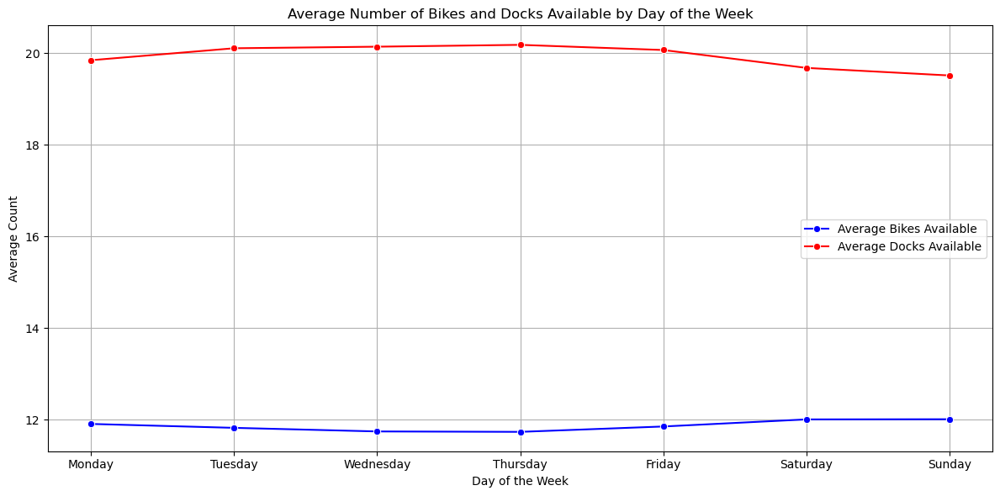

In [33]:
# Calculate average number of bikes and docks available for each day of the week
average_bikes_and_docks_per_day = dublin_bikes.groupby('day_of_week').agg(
    avg_bikes_available=pd.NamedAgg(column='num_bikes_available', aggfunc='mean'),
    avg_docks_available=pd.NamedAgg(column='num_docks_available', aggfunc='mean')
).reset_index()

# Plotting
plt.figure(figsize=(12, 6))

# Line plot for average number of bikes available
sns.lineplot(x='day_of_week', y='avg_bikes_available', data=average_bikes_and_docks_per_day, marker='o', label='Average Bikes Available', color='b')

# Line plot for average number of docks available
sns.lineplot(x='day_of_week', y='avg_docks_available', data=average_bikes_and_docks_per_day, marker='o', label='Average Docks Available', color='r')

plt.title('Average Number of Bikes and Docks Available by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Count')
plt.xticks(ticks=range(7), labels=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.legend()

# Added grid for better readability
plt.grid(True)  
plt.tight_layout()
plt.show()

Average bike usage on weekdays and weekends do not show significant difference.However comparitevely Tuesday, wednesday and thursday bike usage is less.

#### 4.4 Visualizing  num_bikes_available based on hour

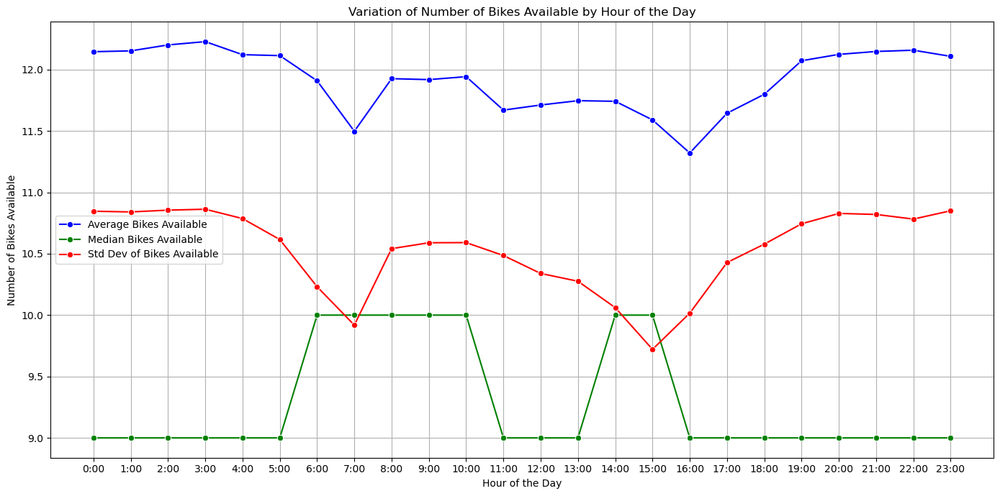

In [34]:
# Calculate statistics for num_bikes_available based on hour
hourly_stats = dublin_bikes.groupby('hour').agg(
    avg_bikes_available=('num_bikes_available', 'mean'),
    median_bikes_available=('num_bikes_available', 'median'),
    std_bikes_available=('num_bikes_available', 'std')
).reset_index()

# Plotting
plt.figure(figsize=(14, 7))

# Define colors and labels for the plots
stats = [
    ('avg_bikes_available', 'Average Bikes Available', 'b'),
    ('median_bikes_available', 'Median Bikes Available', 'g'),
    ('std_bikes_available', 'Std Dev of Bikes Available', 'r')
]

# Line plots for each statistic
for stat, label, color in stats:
    sns.lineplot(x='hour', y=stat, data=hourly_stats, marker='o', label=label, color=color)

# Title and labels
plt.title('Variation of Number of Bikes Available by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Bikes Available')
plt.xticks(ticks=range(24), labels=[f'{i}:00' for i in range(24)])

# Legend and grid
plt.legend()
plt.grid(True)

# Adjust layout
plt.tight_layout()
plt.show()

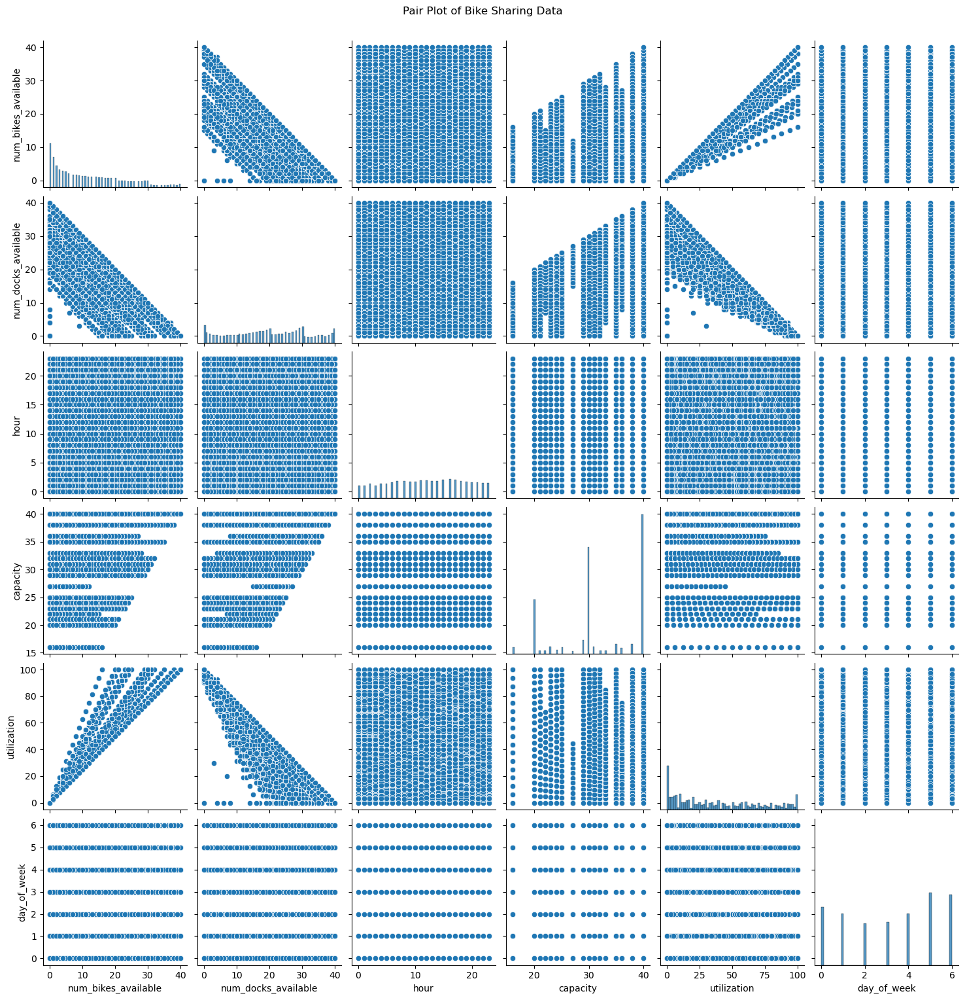

In [35]:
# Select relevant columns for pair plot
columns = ['num_bikes_available', 'num_docks_available', 'hour', 'capacity', 'utilization', 'day_of_week']

# Create pair plot without hue
pair_plot = sns.pairplot(dublin_bikes[columns])

# Add a title above the pair plot
pair_plot.fig.suptitle('Pair Plot of Bike Sharing Data', y=1.02)

# Display the plot
plt.show()

##### 4.5 Number of Docks available in each station between 1st to 17th June 2024 

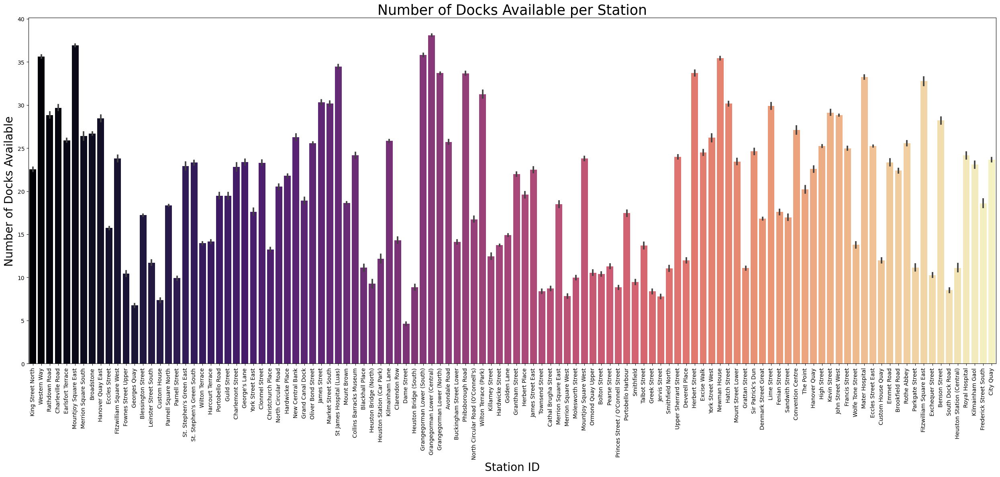

In [36]:
plt.figure(figsize=(25,12))
sns.barplot(data=dublin_bikes, x='location', y='num_docks_available', palette='magma')
plt.title('Number of Docks Available per Station',fontsize=25)
plt.xlabel('Station ID',fontsize=20)
plt.ylabel('Number of Docks Available', fontsize=20)
plt.xticks(rotation=90)
plt.tight_layout()

# Save and display the plot
plt.show()


#### 4.6 Visualize the bike utilization based on bike availability and station capacity

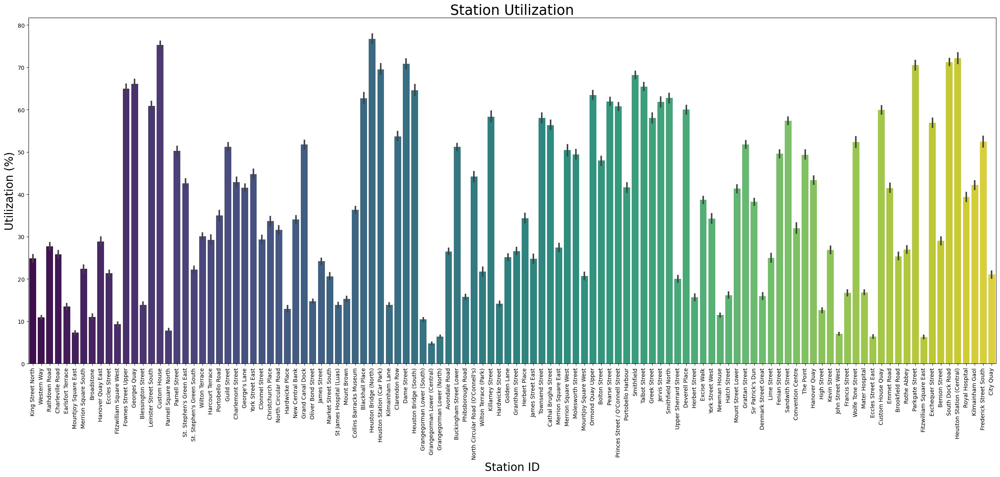

In [37]:
# Plot: Station Utilization
plt.figure(figsize=(25, 12))
sns.barplot(data=dublin_bikes, x='location', y='utilization', palette='viridis')
plt.title('Station Utilization',fontsize=25)
plt.xlabel('Station ID',fontsize=20)
plt.ylabel('Utilization (%)',fontsize=20)
plt.xticks(rotation=90)
plt.tight_layout()

# Save and display the plot
plt.show()

#### 4.7 Visualize the top 10 stations with minimum and maximum utilization  by days of the week

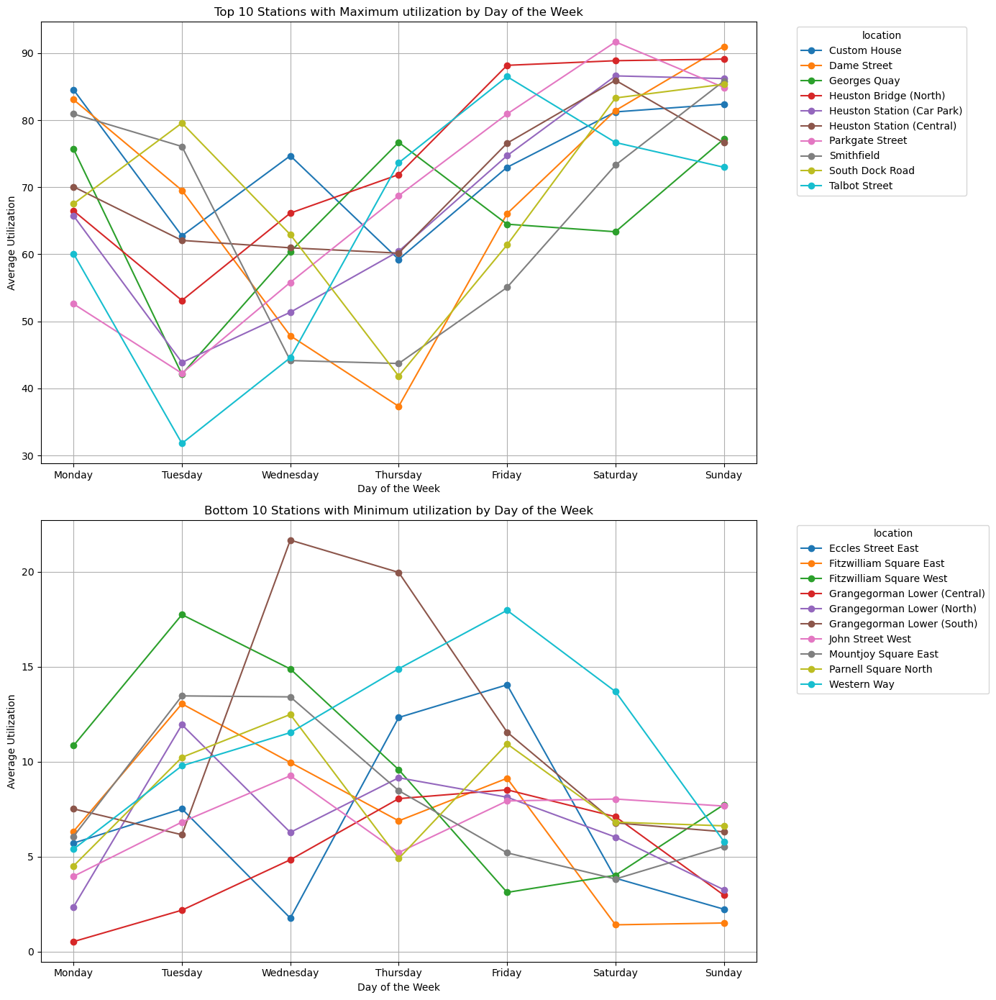

In [38]:

# Group by station and calculate average utilization
station_usage = dublin_bikes.groupby('location')['utilization'].mean().reset_index()

# Identify the top 10 and bottom 10 stations by usage
top_10_stations = station_usage.nlargest(10, 'utilization')['location']
bottom_10_stations = station_usage.nsmallest(10, 'utilization')['location']

# Filter the original dataset for top 10 and bottom 10 stations
top_10_data = dublin_bikes[dublin_bikes['location'].isin(top_10_stations)]
bottom_10_data = dublin_bikes[dublin_bikes['location'].isin(bottom_10_stations)]

# Group by day_of_week and station_id to find average utilization
top_10_daily_usage = top_10_data.groupby(['day_of_week', 'location'])['utilization'].mean().unstack()
bottom_10_daily_usage = bottom_10_data.groupby(['day_of_week', 'location'])['utilization'].mean().unstack()


# Plotting
plt.figure(figsize=(14, 14))

# Add labels for days of the week
plt.xticks(ticks=[0, 1, 2, 3, 4, 5, 6], labels=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

# Plot top 10 stations
plt.subplot(2, 1, 1)
top_10_daily_usage.plot(ax=plt.gca(), kind='line', marker='o')
plt.title('Top 10 Stations with Maximum utilization by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Utilization')
plt.legend(title='location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
# Add labels for days of the week
plt.xticks(ticks=[0, 1, 2, 3, 4, 5, 6], labels=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

# Plot bottom 10 stations
plt.subplot(2, 1, 2)
bottom_10_daily_usage.plot(ax=plt.gca(), kind='line', marker='o')
plt.title('Bottom 10 Stations with Minimum utilization by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Average Utilization')
plt.legend(title='location', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
# Add labels for days of the week
plt.xticks(ticks=[0, 1, 2, 3, 4, 5, 6], labels=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])

plt.tight_layout()
plt.show()


In [39]:
dublin_bikes.head()

,system_id,time_stamp,station_id,num_bikes_available,num_docks_available,is_installed,is_renting,is_returning,location,lat,lon,capacity,hour,utilization,day_of_week
0,dublin_bikes,2024-06-01 00:05:00,101,7,23,True,True,True,King Street North,53.350292,-6.273507,30,0,23.333333,5
1,dublin_bikes,2024-06-01 00:05:00,102,16,24,True,True,True,Western Way,53.354930,-6.269425,40,0,40.000000,5
2,dublin_bikes,2024-06-01 00:05:00,106,2,38,True,True,True,Rathdown Road,53.358930,-6.280337,40,0,5.000000,5
3,dublin_bikes,2024-06-01 00:05:00,107,6,34,True,True,True,Charleville Road,53.359158,-6.281866,40,0,15.000000,5
4,dublin_bikes,2024-06-01 00:05:00,11,1,29,True,True,True,Earlsfort Terrace,53.334293,-6.258503,30,0,3.333333,5


#### 4.8 Identifying the instances of no bikes available during the day of the week for every station

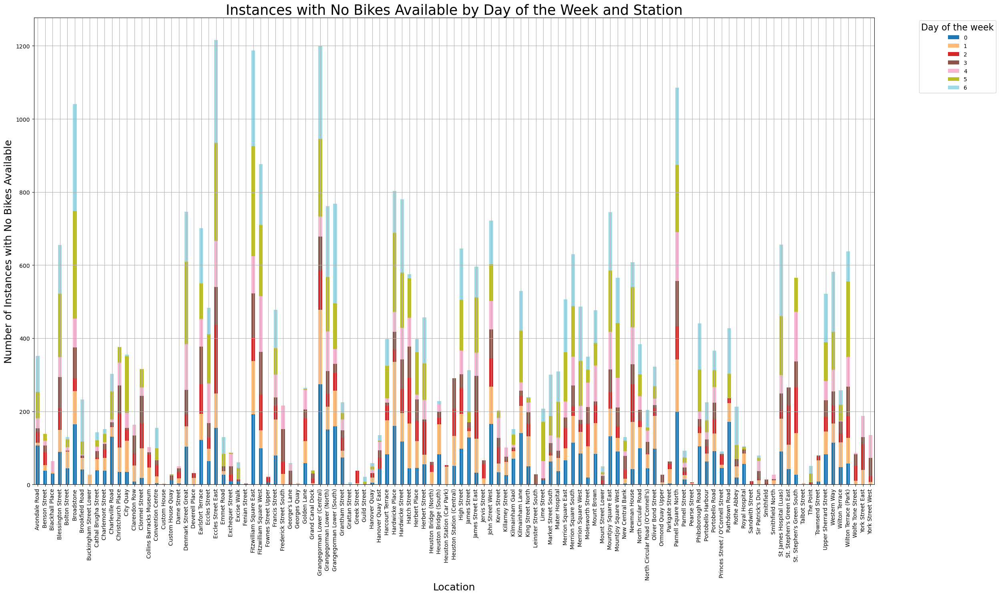

In [40]:
# Filter the dataset to find instances where there are no bikes available
no_bikes_data = dublin_bikes[dublin_bikes['num_bikes_available'] == 0]

# Group by day_of_week and station_id to find the count of instances with no bikes available
no_bikes_count = no_bikes_data.groupby(['location', 'day_of_week']).size().unstack(fill_value=0)

# Plot the count of instances with no bikes available for each station by day of the week
no_bikes_count.plot(kind='bar', stacked=True, colormap='tab20', figsize=(25, 15))

plt.title('Instances with No Bikes Available by Day of the Week and Station',fontsize=25)
plt.xlabel('Location',fontsize=18)
plt.ylabel('Number of Instances with No Bikes Available', fontsize=18)
plt.legend(title='Day of the week', bbox_to_anchor=(1.05, 1), loc='upper left',title_fontsize=16)
plt.grid(True)
plt.tight_layout()
plt.show()

A stacked bar plot is created, where each bar represents a day of the week and is stacked with different colors representing different stations. The legend helps identify which part of each bar corresponds to which station.

#### How does bike availability change during weekdays vs. weekends?

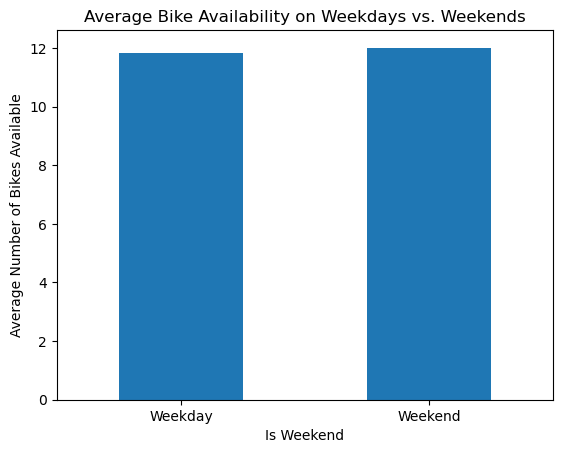

In [41]:
# Categorize days into weekdays (0-4) and weekends (5-6)
dublin_bikes['is_weekend'] = dublin_bikes['day_of_week'] >= 5

# Group by is_weekend to find the average bike availability
weekend_availability = dublin_bikes.groupby('is_weekend')['num_bikes_available'].mean()

# Plot bike availability for weekdays vs. weekends
weekend_availability.plot(kind='bar')
plt.title('Average Bike Availability on Weekdays vs. Weekends')
plt.xlabel('Is Weekend')
plt.ylabel('Average Number of Bikes Available')
plt.xticks(ticks=[0, 1], labels=['Weekday', 'Weekend'], rotation=0)
plt.show()

#### 4.8 Bike availibility at various Dublin stations during different hours

In [42]:
# Extract date and time components
dublin_bikes['date'] = dublin_bikes['time_stamp'].dt.date
dublin_bikes['hour'] = dublin_bikes['time_stamp'].dt.hour
#dublin_bikes['minute'] = dublin_bikes['time_stamp'].dt.minute

# Aggregate bike availability by station and hour
station_availability = dublin_bikes.groupby(['location', 'lat', 'lon', 'date', 'hour'])['num_bikes_available'].mean().reset_index()

# Rename columns for clarity
station_availability.columns = ['Station', 'Latitude', 'Longitude', 'Date', 'Hour','Average_Bikes_Available']

# Create the animated scatter plot
fig = px.scatter_mapbox(
    station_availability,
    lat='Latitude',
    lon='Longitude',
    color='Average_Bikes_Available',
    size='Average_Bikes_Available',
    animation_frame='Hour',
    animation_group='Station',
    hover_name='Station',
    hover_data={'Average_Bikes_Available': True},
    color_continuous_scale='Viridis',
    size_max=15,
    zoom=12,
    mapbox_style='open-street-map',
    title='Bike Availability at Dublin stations during different hours'
)

# Show the map
fig.show()


In [43]:
station_availability.head()

,Station,Latitude,Longitude,Date,Hour,Average_Bikes_Available
0,Avondale Road,53.359406,-6.276142,2024-06-01,0,14.000000
1,Avondale Road,53.359406,-6.276142,2024-06-01,1,14.000000
2,Avondale Road,53.359406,-6.276142,2024-06-01,2,14.000000
3,Avondale Road,53.359406,-6.276142,2024-06-01,3,14.000000
4,Avondale Road,53.359406,-6.276142,2024-06-01,4,13.142857


In [44]:
dublin_bikes.head()

,system_id,time_stamp,station_id,num_bikes_available,num_docks_available,is_installed,is_renting,is_returning,location,lat,lon,capacity,hour,utilization,day_of_week,is_weekend,date
0,dublin_bikes,2024-06-01 00:05:00,101,7,23,True,True,True,King Street North,53.350292,-6.273507,30,0,23.333333,5,True,2024-06-01
1,dublin_bikes,2024-06-01 00:05:00,102,16,24,True,True,True,Western Way,53.354930,-6.269425,40,0,40.000000,5,True,2024-06-01
2,dublin_bikes,2024-06-01 00:05:00,106,2,38,True,True,True,Rathdown Road,53.358930,-6.280337,40,0,5.000000,5,True,2024-06-01
3,dublin_bikes,2024-06-01 00:05:00,107,6,34,True,True,True,Charleville Road,53.359158,-6.281866,40,0,15.000000,5,True,2024-06-01
4,dublin_bikes,2024-06-01 00:05:00,11,1,29,True,True,True,Earlsfort Terrace,53.334293,-6.258503,30,0,3.333333,5,True,2024-06-01


In [45]:
dublin_bikes.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 315747 entries, 0 to 315746
Data columns (total 17 columns):
 #   Column               Non-Null Count   Dtype         
---  ------               --------------   -----         
 0   system_id            315747 non-null  object        
 1   time_stamp           315747 non-null  datetime64[ns]
 2   station_id           315747 non-null  int64         
 3   num_bikes_available  315747 non-null  int64         
 4   num_docks_available  315747 non-null  int64         
 5   is_installed         315747 non-null  bool          
 6   is_renting           315747 non-null  bool          
 7   is_returning         315747 non-null  bool          
 8   location             315747 non-null  object        
 9   lat                  315747 non-null  float64       
 10  lon                  315747 non-null  float64       
 11  capacity             315747 non-null  int64         
 12  hour                 315747 non-null  int64         
 13  utilization   

# 5. Machine Learning

### 4.1 Data Pre-processing and Data extraction

### 5.1.1 Finding the co-relation between variables.

,num_bikes_available,num_docks_available,capacity,station_id,hour,utilization,day_of_week
num_bikes_available,1.000000,-0.762839,0.194546,0.011363,-0.004158,0.935469,0.005856
num_docks_available,-0.762839,1.000000,0.458263,0.337595,0.002760,-0.879073,-0.013165
capacity,0.194546,0.458263,1.000000,0.547865,-0.004144,-0.080392,-0.002968
station_id,0.011363,0.337595,0.547865,1.000000,-0.008116,-0.136315,0.002311
hour,-0.004158,0.002760,-0.004144,-0.008116,1.000000,0.000959,0.022795
utilization,0.935469,-0.879073,-0.080392,-0.136315,0.000959,1.000000,0.023046
day_of_week,0.005856,-0.013165,-0.002968,0.002311,0.022795,0.023046,1.000000


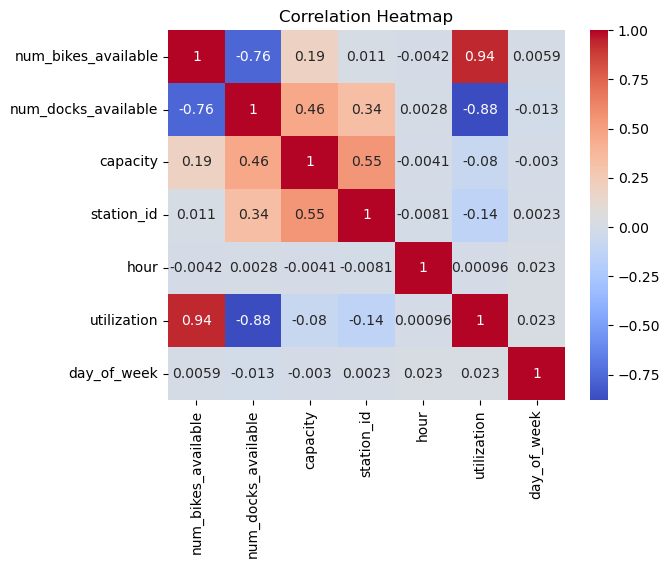

In [46]:
corr = dublin_bikes[['num_bikes_available', 'num_docks_available', 'capacity','station_id','hour','utilization','day_of_week']].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
corr

The heatmap shows co-relation between the features. We can see that number of bikes available and utilization of station are highly co-related. Hence, I am choosing to predict the number of bikes available based on features that are co-related to the target variable number of bikes.

### 5.1.2 Feature Selection

To fit a linear regression model, we select those features which have a high correlation with our target variable num_bikes_available.Below getCorrelatedFeature function is used to find those features by comparing their absolute value of correlated features with threshold.

In [47]:
#Function to find the co-relation of num_bikes_available with other variables.
def getCorrelatedFeature(Corrdata, threshold):
    feature = []
    value = []
    
    for i , index in enumerate(Corrdata.index):
        if abs(Corrdata[index])>threshold:
            feature.append(index)
            value.append(Corrdata[index])
    df = pd.DataFrame(data = value, index = feature, columns = ['corr value'])
    return df
threshold = 0.0
corr_value = getCorrelatedFeature(corr['num_bikes_available'],threshold)
corr_value

,corr value
num_bikes_available,1.000000
num_docks_available,-0.762839
capacity,0.194546
station_id,0.011363
hour,-0.004158
utilization,0.935469
day_of_week,0.005856


In [48]:
#dataset contains only high correlation features with variable num_bikes_available.
dublin_bikes_corr = dublin_bikes[corr_value.index]
dublin_bikes_corr.head()

,num_bikes_available,num_docks_available,capacity,station_id,hour,utilization,day_of_week
0,7,23,30,101,0,23.333333,5
1,16,24,40,102,0,40.000000,5
2,2,38,40,106,0,5.000000,5
3,6,34,40,107,0,15.000000,5
4,1,29,30,11,0,3.333333,5


In [49]:
%%timeit
dublin_bikes_corr.head()

3.86 µs ± 17.4 ns per loop (mean ± std. dev. of 7 runs, 100,000 loops each)


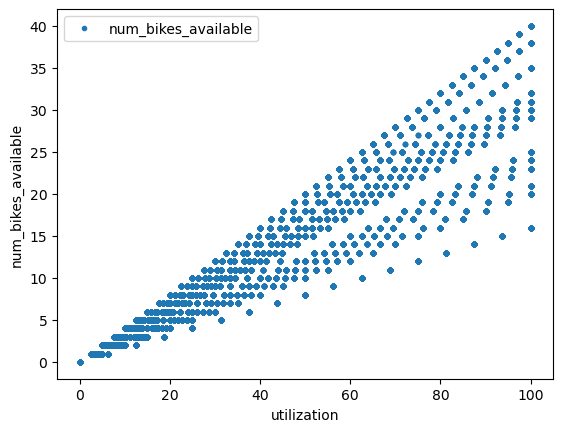

In [50]:
#visualise the change in variables
dublin_bikes_corr.plot(x='utilization',y='num_bikes_available',style='.')
plt.xlabel('utilization')
plt.ylabel('num_bikes_available')
plt.show()

<Axes: xlabel='utilization', ylabel='num_bikes_available'>

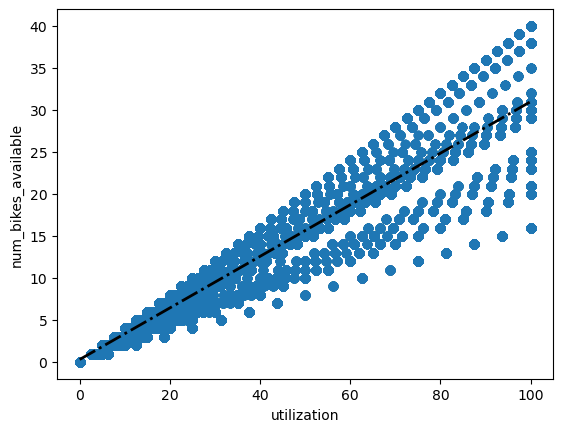

In [51]:
sns.regplot(x="utilization",
            y="num_bikes_available", 
            data=dublin_bikes_corr,
            line_kws={"color": "black", "linestyle": "-.", "linewidth": 2})

### 5.1.3 Scaling

In [52]:

scaler = StandardScaler()

dublin_bikes_corr_scale = pd.DataFrame(scaler.fit_transform(dublin_bikes_corr),columns=dublin_bikes_corr.columns)

## 5.2 Machine learning models

## Predicting the number of bikes available at Dublin stations

In [53]:
dublin_bikes_corr_scale.head()

,num_bikes_available,num_docks_available,capacity,station_id,hour,utilization,day_of_week
0,-0.465661,0.266380,-0.265108,1.272866,-1.794204,-0.451633,0.841237
1,0.390974,0.351907,1.077756,1.302374,-1.794204,0.068933,0.841237
2,-0.941570,1.549289,1.077756,1.420405,-1.794204,-1.024255,0.841237
3,-0.560843,1.207180,1.077756,1.449912,-1.794204,-0.711915,0.841237
4,-1.036751,0.779544,-0.265108,-1.382834,-1.794204,-1.076311,0.841237


In [54]:
#Divide data into dependent and independent variables into x and y
X = dublin_bikes_corr_scale.drop(labels = ['num_bikes_available'], axis = 1)
y = dublin_bikes_corr_scale['num_bikes_available']

In [55]:

X_train, X_test , y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 42 )
X_train.shape , X_test.shape, y_train.shape,y_test.shape

((221022, 6), (94725, 6), (221022,), (94725,))

### 5.2.1 Linear Regression

In [56]:

model = LinearRegression()
model.fit(X_train , y_train)
predict = model.predict(X_test)

In [57]:
print('Best fit line has the intercept value of', model.intercept_)
print('Best fit line has the slope value of', model.coef_)

Best fit line has the intercept value of -0.00024362008930831145
Best fit line has the slope value of [-0.59450956  0.50508015 -0.00288018 -0.00084959  0.45314849 -0.01083423]


In [58]:
#compare actual and predicted value of number of bikes available from simple linear regression.
simple_compare = pd.DataFrame({"Predicted":predict , "Actual": y_test})
simple_compare.head(10)

,Predicted,Actual
246975,0.352362,0.200610
67398,0.105346,0.105429
283546,2.427600,2.675334
301018,-1.431922,-1.131933
49644,-1.336904,-1.131933
275336,0.222001,0.105429
229212,-0.737746,-0.656025
114543,1.140173,1.247609
222826,-1.221109,-1.036751
160868,0.693891,0.771700


In [59]:

print('R2 score of this model:', r2_score(y_test, predict))
print('Mean absolute error of this model:', mean_absolute_error(y_test, predict))
print('Mean squared error of this model:', mean_squared_error(y_test, predict))
print('Root mean squared error of this model:', np.sqrt(mean_squared_error(y_test, predict)))

R2 score of this model: 0.9766424079218791
Mean absolute error of this model: 0.08600684204461516
Mean squared error of this model: 0.02340391974592983
Root mean squared error of this model: 0.15298339696166324


### 5.2.2 Decision Tree

In [60]:


# Train the model
model = DecisionTreeRegressor(random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)

# Print the evaluation metrics
print(f'R^2 Score: {r2}')
print(f'Mean Absolute Error: {mae}')
print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')


R^2 Score: 0.9999998090975677
Mean Absolute Error: 2.0096419673779e-06
Mean Squared Error: 1.9128107003522275e-07
Root Mean Squared Error: 0.0004373569137846374


### 4.2.3 Random forest

In [61]:


# Train the model
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)

# Print the evaluation metrics
print(f'R^2 Score: {r2}')
print(f'Mean Absolute Error: {mae}')
print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')


R^2 Score: 0.9999999291656525
Mean Absolute Error: 2.5221006537332295e-06
Mean Squared Error: 7.097484103656667e-08
Root Mean Squared Error: 0.0002664110377528804


### 5.2.4 Gradient Boosting

In [62]:


# Train the model
model = GradientBoostingRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Evaluate the model
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mse)

# Print the evaluation metrics
print(f'R^2 Score: {r2}')
print(f'Mean Absolute Error: {mae}')
print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')


R^2 Score: 0.9995534871690849
Mean Absolute Error: 0.015721209039184232
Mean Squared Error: 0.0004473984486634737
Root Mean Squared Error: 0.02115179540047307


### 5.3 Cross validation to provide authenticity of the modelling outcomes

In [63]:


# Define models
models = {
    'Linear Regression': LinearRegression(),
    'Gradient Boost': GradientBoostingRegressor(),
    'Decision Tree': DecisionTreeRegressor(),
    'Random Forest': RandomForestRegressor()
}

# Perform cross-validation
cv_results = {}
for model_name, model in models.items():
    scores = cross_val_score(model, X, y, cv=10, scoring='r2')
    cv_results[model_name] = scores.mean()

# Print the cross-validation results
for model_name, score in cv_results.items():
    print(f'{model_name}: R2 Score = {score}')

Linear Regression: R2 Score = 0.9699160188819524
Gradient Boost: R2 Score = 0.999504746373628
Decision Tree: R2 Score = 0.9999975366708315
Random Forest: R2 Score = 0.999995921840686


### 5.4 Decision Tree Regressor with Hyperparameter Tuning

In [64]:
# Initialize model
dt = DecisionTreeRegressor()

# Hyperparameter tuning
params = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 10, 20],
    'min_samples_leaf': [1, 5, 10]
}
grid_dt = GridSearchCV(dt, params, cv=5)
grid_dt.fit(X_train, y_train)

# Predict and evaluate
y_pred_dt = grid_dt.predict(X_test)
print("Decision Tree Regressor MAE:", mean_absolute_error(y_test, y_pred_dt))
print("Decision Tree Regressor MSE:", mean_squared_error(y_test, y_pred_dt))
print("Decision Tree Regressor R2:", r2_score(y_test, y_pred_dt))


Decision Tree Regressor MAE: 2.0096419660475895e-06
Decision Tree Regressor MSE: 1.9128107003522275e-07
Decision Tree Regressor R2: 0.9999998090975677


### 5.5 Linear Regression with hyperparameter tuning

In [65]:
# Define the hyperparameter grid for Ridge and Lasso
ridge_params = {'alpha': [0.01, 0.1, 1, 10, 100]}
lasso_params = {'alpha': [0.01, 0.1, 1, 10, 100]}

# Ridge regression
ridge = Ridge()
ridge_grid_search = GridSearchCV(estimator=ridge, param_grid=ridge_params, cv=3)
ridge_grid_search.fit(X_train, y_train)
best_ridge_params = ridge_grid_search.best_params_

# Lasso regression
lasso = Lasso()
lasso_grid_search = GridSearchCV(estimator=lasso, param_grid=lasso_params, cv=3)
lasso_grid_search.fit(X_train, y_train)
best_lasso_params = lasso_grid_search.best_params_

# Print the best hyperparameters
print("Best Ridge Parameters:", best_ridge_params)
print("Best Lasso Parameters:", best_lasso_params)

# Evaluate the models on the test set
best_ridge_model = ridge_grid_search.best_estimator_
best_lasso_model = lasso_grid_search.best_estimator_

# Predictions
ridge_predictions = best_ridge_model.predict(X_test)
lasso_predictions = best_lasso_model.predict(X_test)

# Evaluation metrics for Ridge
ridge_r2 = r2_score(y_test, ridge_predictions)
ridge_mse = mean_squared_error(y_test, ridge_predictions)
ridge_mae = mean_absolute_error(y_test, ridge_predictions)

# Evaluation metrics for Lasso
lasso_r2 = r2_score(y_test, lasso_predictions)
lasso_mse = mean_squared_error(y_test, lasso_predictions)
lasso_mae = mean_absolute_error(y_test, lasso_predictions)

# Print the evaluation metrics
print("Ridge Test R²:", ridge_r2)
print("Ridge Test MSE:", ridge_mse)
print("Ridge Test MAE:", ridge_mae)
print("Lasso Test R²:", lasso_r2)
print("Lasso Test MSE:", lasso_mse)
print("Lasso Test MAE:", lasso_mae)

Best Ridge Parameters: {'alpha': 1}
Best Lasso Parameters: {'alpha': 0.01}
Ridge Test R²: 0.9766423412156616
Ridge Test MSE: 0.02340398658445301
Ridge Test MAE: 0.08600948041855176
Lasso Test R²: 0.9757554052798662
Lasso Test MSE: 0.024292681677325317
Lasso Test MAE: 0.0931517163960119


### 6. Dash to visualize Dublin bike availability at different stations at an chosen date and hour of the day.

Select the hour in dropdown and observe the data required on map. The line graph shows the bike availability from June 1st to June 15th at the chosen hour in the dropdown.

In [67]:
# Initialize Dash app
app = Dash(__name__)


# App layout
app.layout = html.Div(style={'backgroundColor': 'green', 'padding': '20px'}, children=[
    html.H1("Dublin Bikes Availability", style={'color': 'white'}),
    
    # Dropdown for hour selection
    dcc.Dropdown(
        id='hour-dropdown',
        options=[{'label': f'{hour}:00', 'value': hour} for hour in range(24)],
        value=0,  # Default value for hour
        clearable=False,
        style={'width': '80%', 'margin': 'auto', 'color': 'black'}
    ),
    
    # Scatter map for bike availability
    dcc.Graph(id='scatter-map',
              style={'height': '80vh', 'width': '105vw', 'margin': 'auto'} ),
    
    # Line chart to show variation in bike availability
    dcc.Graph(id='bike-usage-variation')
])

# Callback to update the scatter map and line chart based on selected hour
@app.callback(
    [Output('scatter-map', 'figure'),
     Output('bike-usage-variation', 'figure')],
    Input('hour-dropdown', 'value')
)
def visualizations(selected_hour):
    # Filter data for the selected hour
    filtered_df = station_availability[station_availability['Hour'] == selected_hour]
    
    # Scatter map visualization
    fig_map = px.scatter_mapbox(
        filtered_df,
        lat='Latitude',
        lon='Longitude',
        color='Average_Bikes_Available',
        size='Average_Bikes_Available',
        animation_frame='Date',
        animation_group='Station',
        hover_name='Station',
        hover_data={'Average_Bikes_Available': True},
        color_continuous_scale='Viridis',
        size_max=15,
        zoom=12,
        mapbox_style='open-street-map',
        title=f'Bike Availability at Dublin Stations for Hour {selected_hour}'
    )

    # Line chart to show bike usage variation over time for the selected hour
    daily_usage = dublin_bikes[dublin_bikes['hour'] == selected_hour].groupby('date')['num_bikes_available'].mean().reset_index()
    
    fig_line = px.line(
        daily_usage,
        x='date',
        y='num_bikes_available',
        title=f'Average Bike Availability Over Days at Hour {selected_hour}',
        labels={'date': 'Date', 'num_bikes_available': 'Average Number of Bikes Available'}
    )
    
    return fig_map, fig_line

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True, port=8052)